<a href="https://colab.research.google.com/github/jot240/Semantic-Image-Clustering/blob/main/imageindexing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Image Indexing using Image Captioning**
## Deep Learning


---

Joseph THOMPSON   °   Mariana SANCHEZ


---

## I. Required Installations and Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
! pip install sentence_transformers
! pip install umap-learn
! pip install hdbscan

Manifold learning-- T-SNE UMAP


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
! cd /content/drive/MyDrive/png

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import nltk
nltk.download('punkt')

import pandas as pd
import re
from sentence_transformers import SentenceTransformer, util

from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import numpy as np
import umap
import hdbscan

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## II. Import Data

The data that we use for this anaylsis is a folder of 290 images and a CSV file with the captions for these images that were generated by the Show and Tell Network. 

We first get rid of the special "start" and "end" tokens that determine the limits of the caption. The rest of the sentence can be passed into the tranformer NN without modification.

In [ ]:
# Import captions generated using image captioning model
captions_df = pd.read_csv('datainfo.csv')
captions_df.info()
captions_df['sentence'] = captions_df['sentence'].str.replace(r"<start>","").str.replace(r"<end>","")

# Path to the images database
filepath = '/content/drive/MyDrive/png/'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290 entries, 0 to 289
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  290 non-null    int64 
 1   file_name   290 non-null    object
 2   directory   290 non-null    object
 3   sentence    290 non-null    object
dtypes: int64(1), object(3)
memory usage: 9.2+ KB


Here we import a pre-trained transformer model that we will use to embed the captions and the user queries. It maps sentences to a 384 dimension vector space. Here is the link: https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2. This model was trained on 1B sentence pairs, which are two sentences that are deemed similar. It can take as input text as long as 256 words, which works for our use case.

We then go ahead and embed all of the captions in our CSV file as both a tensor and numpy array for later. 

In [ ]:
# Set 'all-MiniLM-L6-v2' as model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Get the captions from the dataframe
sentences2 = captions_df['sentence']
embeddings_tensor = model.encode(sentences2, convert_to_tensor=True)
embedding_array = model.encode(sentences2)

captions_df['embedding'] = embeddings_tensor

## III. Clustering

### Agglomerative clustering (plotting with PCA)

We first try agglomerative clustering in the full 384 dimension vector space. It uses the cosine difference to measure the difference between two captions. The cosine distance takes into account the angle between two vectors and not their magnitude, which works well in this clustering task. Similar sentences should have a small angle between them. 

To plot the results, we use PCA to reduce the space to two dimensions.

384


Text(0.5, 1.0, 'Agglomerative Clustering (using 384 dimensions)')

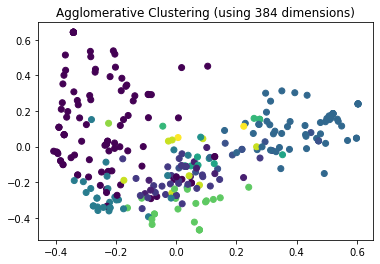

In [ ]:
# Set Agglomerative cluster parameters
X = embedding_array
cluster_number = 13
print(len(embedding_array[1]))
clustering = AgglomerativeClustering(n_clusters= cluster_number, affinity='cosine',linkage='average').fit(X)

# Add Cluster labels to dataset
captions_df['cluster_number'] = clustering.labels_

# Reduce 384 dimensions to plot
pca = PCA(n_components = 2).fit(X)
coords = pca.transform(X)

plt.scatter(coords[:,0],coords[:,1], c= clustering.labels_.astype(float))
plt.title("Agglomerative Clustering (using 384 dimensions)")

### Clustering/plotting with UMAP

We then tried doing dimensionality reduction first with UMAP and then clustering using HDBSCAN. We compare the results of the clustering with agglomerative clustering (384 dimensions) and the clustering with HDBSCAN (2 dimensions).

(290, 384)


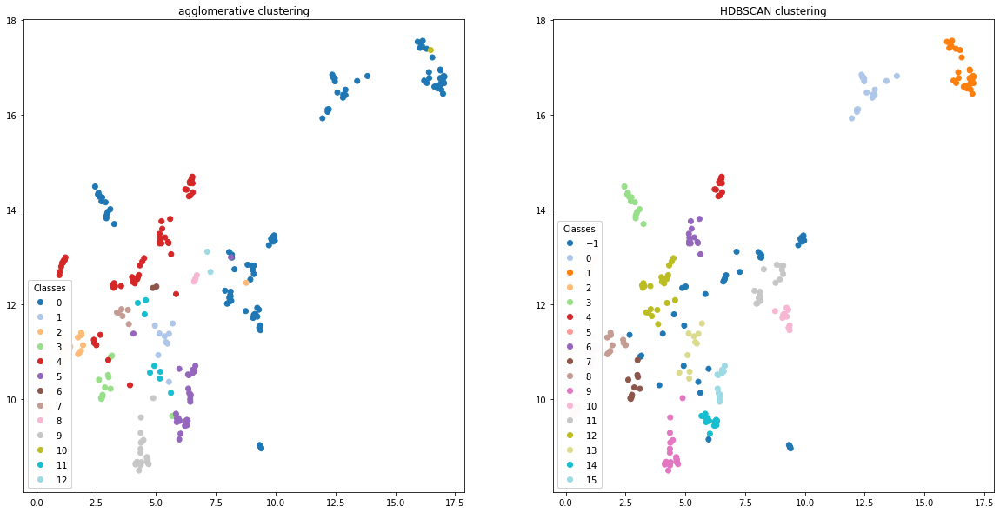

In [ ]:
# Reduce dimensionality using UMAP
clusterable_embedding = umap.UMAP()
print(X.shape)
coords= clusterable_embedding.fit_transform(X)

# Cluster using HDBSCAN
labels = hdbscan.HDBSCAN(
    min_samples=5,
    min_cluster_size=10,
).fit_predict(coords)
captions_df['cluster_number'] = labels

# Plot Agglomerative Clustering
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,10))
scatter1 = ax1.scatter(coords[:,0],coords[:,1],c= clustering.labels_.astype(float), cmap="tab20")
ax1.set_title("agglomerative clustering")
legend1 = ax1.legend(*scatter1.legend_elements(num=cluster_number),
                    loc="lower left", title="Classes")
ax1.add_artist(legend1)

# Plot HDBSCAN clustering
scatter2 = ax2.scatter(coords[:,0],coords[:,1],c= labels.astype(float), cmap="tab20")
ax2.set_title("HDBSCAN clustering")
legend2 = ax2.legend(*scatter2.legend_elements(num=len(set(labels))),
                    loc="lower left", title="Classes")
ax2.add_artist(legend2)

We tested both agglomerative clustering on the non-reduced dataset as well as HDBSCAN clustering on the data reduced with UMAP. It seemed like the clustering with HDBSCAN formed more meaningful clusters. Below we print the images for each cluster along with their captions. In HDBSCAN, the class -1 is reserved for the elements that are considered as "noise", or without an actual class.





Images included in cluster -1
    -  a man wearing a suit and tie with a tie . 
    -  a man and woman in a kitchen with a large cake . 
    -  a dog is laying on a wooden bench . 
    -  a man wearing a suit and tie with a tie . 
    -  a man is sitting on a motorcycle in a park . 
    -  a bathroom with a sink and a window . 
    -  a toilet with a seat of a toilet in it . 
    -  a bathroom with a toilet and a sink . 
    -  a woman walking in the rain with a umbrella . 
    -  a man and woman in a kitchen with a cake and a table . 


<Figure size 72x72 with 0 Axes>

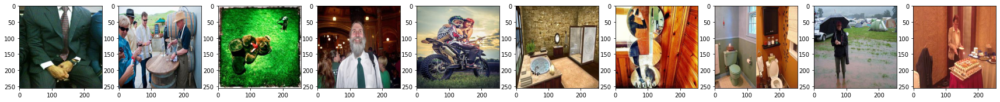


Images included in cluster 0
    -  a bunch of different types of different types of scissors . 
    -  a bunch of different types of different types of scissors . 
    -  a bunch of different types of doughnuts on a table . 
    -  a glass vase with a glass and a glass vase 
    -  a large vase with a bunch of stuffed animals . 
    -  a bunch of doughnuts that are on a table . 
    -  a bowl of oranges sitting on a table . 
    -  a person is holding a banana in a basket . 
    -  a pair of scissors and a pair of scissors . 
    -  a table with a bunch of different items on it . 


<Figure size 72x72 with 0 Axes>

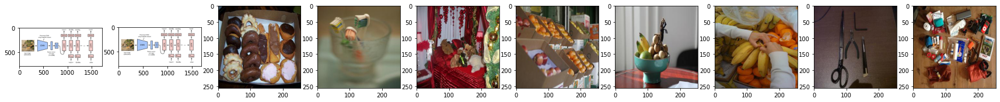


Images included in cluster 1
    -  a hot dog with mustard and ketchup on a plate . 
    -  a plate of food with a fork and a fork . 
    -  a woman eating a piece of pizza on a plate . 
    -  a man is eating a piece of pizza . 
    -  a pizza with a slice missing on it . 
    -  a bowl of food with a bowl of soup on it . 
    -  a plate of food with a fork and a fork . 
    -  a pizza is on a wooden table with a knife . 
    -  a plate of food with a fork and a fork . 
    -  a plate of food with a fork and a fork . 


<Figure size 72x72 with 0 Axes>

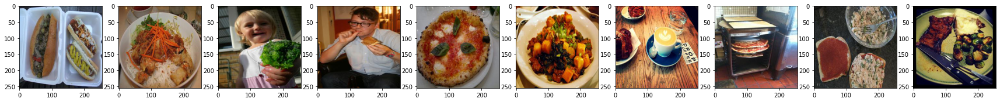


Images included in cluster 2
    -  a man is standing next to a man on a skateboard . 
    -  a man is standing on a skateboard in the street . 
    -  a man is jumping a skateboard on a ramp . 
    -  a man is standing on a skateboard in the middle of a building . 
    -  a man is standing on a skateboard in a city . 
    -  a man is doing a trick on a skateboard . 
    -  a man is doing a trick on a skateboard . 
    -  a man is doing a trick on a skateboard . 
    -  a man is doing a trick on a skateboard . 
    -  a man is doing a trick on a skateboard . 


<Figure size 72x72 with 0 Axes>

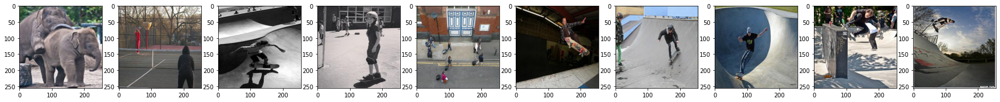


Images included in cluster 3
    -  a small airplane is sitting on the runway . 
    -  a large airplane is parked on the runway . 
    -  a group of people standing around a large airplane . 
    -  a large airplane sitting on top of a runway . 
    -  a large airplane is flying in the sky . 
    -  a large airplane with a bunch of people in it . 
    -  a large airplane sitting on top of a shelf . 
    -  a large airplane is flying in the sky . 
    -  a large airplane sitting on the side of a runway . 
    -  a large airplane is sitting on the ground . 


<Figure size 72x72 with 0 Axes>

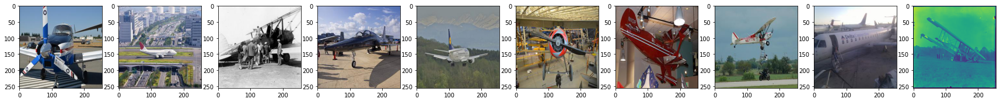


Images included in cluster 4
    -  a man is playing tennis on a tennis court . 
    -  a group of people playing a game of tennis . 
    -  a woman holding a tennis racket in a tennis court . 
    -  a man is playing tennis on a tennis court . 
    -  a man is playing tennis on a tennis court . 
    -  a man holding a tennis racket in his hand . 
    -  a man is playing tennis on a tennis court . 
    -  a man holding a tennis racket and a tennis ball . 
    -  a man is playing tennis on a tennis court . 
    -  a man is holding a glass of wine . 


<Figure size 72x72 with 0 Axes>

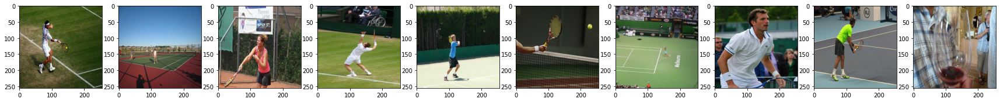


Images included in cluster 5
    -  a train is pulling into a station with a train on it . 
    -  a red and yellow train is parked on the side of a road . 
    -  a train station with a train on the platform . 
    -  a train is traveling down a track next to a building . 
    -  a train is traveling down a track next to a building . 
    -  a black and white photo of a train station . 
    -  a train is going down a track in the snow . 
    -  a train is pulling up to a train station . 
    -  a train that is sitting on the tracks . 
    -  a black and white photo of a train on a track 


<Figure size 72x72 with 0 Axes>

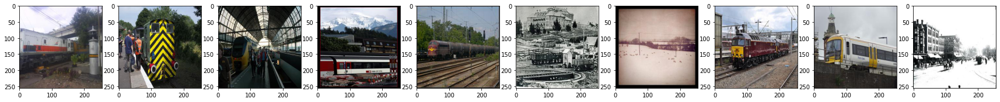


Images included in cluster 6
    -  a man is playing frisbee in a park . 
    -  a man is holding a wii remote in his hand . 
    -  a group of young men playing a game of soccer . 
    -  a man is playing a video game on a wii game . 
    -  a man and a woman are playing a video game . 
    -  two men playing frisbee in a field with a frisbee . 
    -  a man and a woman playing frisbee in a park . 
    -  a person holding a frisbee in a park . 
    -  a group of young men playing a game of frisbee . 
    -  a man holding a baseball bat in front of a crowd . 


<Figure size 72x72 with 0 Axes>

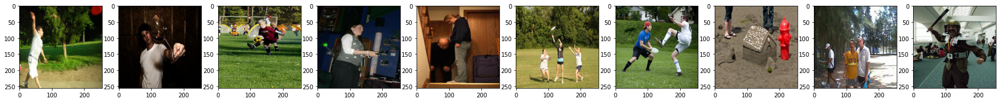


Images included in cluster 7
    -  a man is skiing down a hill on a snowy day . 
    -  a person is skiing down a hill in the snow . 
    -  a black and white photo of a person on a snowboard . 
    -  a man is skiing down a snowy slope . 
    -  a person on skis in the snow with a red and red flag . 
    -  a view of a mountain with a mountain in the background 
    -  a man is skiing down a snowy slope . 
    -  a group of people on skis in the snow . 
    -  a man is skiing down a snowy slope . 
    -  a group of people on skis in the snow . 


<Figure size 72x72 with 0 Axes>

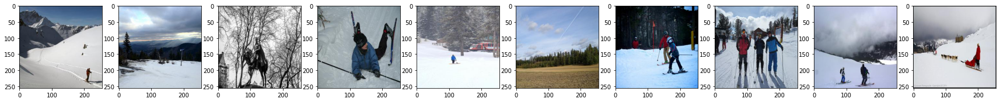


Images included in cluster 8
    -  a street sign with a street sign and a street sign . 
    -  a man is standing in front of a bus . 
    -  a yellow and yellow bus on a city street . 
    -  a red and yellow bus driving down a street . 
    -  a bicycle parked in front of a building . 
    -  a motorcycle parked on a street next to a building . 
    -  a bus parked on a street next to a building . 
    -  a man riding a motorcycle on a road . 
    -  a motorcycle parked in front of a building . 
    -  a city street with a lot of cars and buildings . 


<Figure size 72x72 with 0 Axes>

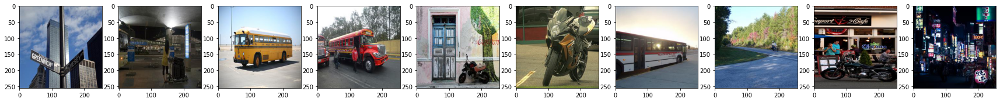


Images included in cluster 9
    -  a group of giraffes standing next to each other . 
    -  a dog is sitting on a green grass covered field . 
    -  a group of elephants walking through a forest . 
    -  a group of elephants walking through a river . 
    -  a giraffe standing in a field next to a tree . 
    -  a giraffe standing in a field next to a tree . 
    -  a large elephant standing next to a pile of rocks . 
    -  a large elephant standing next to a small elephant . 
    -  a group of giraffes standing next to each other . 
    -  a man is petting a giraffe in a fenced area . 


<Figure size 72x72 with 0 Axes>

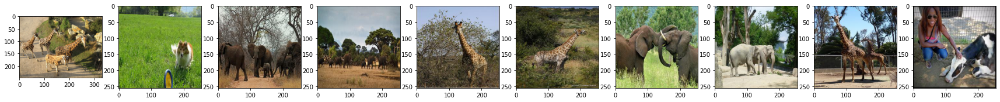


Images included in cluster 10
    -  a living room with a couch , a television , and a television . 
    -  a bed with a bed in a room . 
    -  a living room with a couch , chair and a television . 
    -  a room with a bunch of luggage on it . 
    -  a living room with a couch , a table and a television . 
    -  a living room with a couch and a table . 
    -  a large television sitting on top of a shelf . 
    -  a bed with a bed in a room . 
    -  a living room with a couch , chair and a table . 
    -  a bed with a bed and a television on it . 


<Figure size 72x72 with 0 Axes>

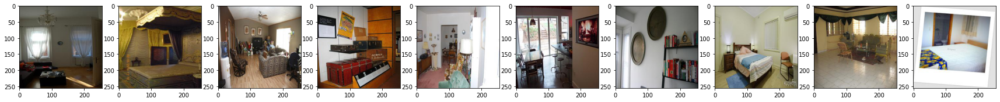


Images included in cluster 11
    -  a microwave oven sitting on top of a wooden table . 
    -  a desk with a computer and a phone on it . 
    -  a laptop computer sitting on a desk next to a keyboard . 
    -  a kitchen with a refrigerator and a refrigerator 
    -  a laptop computer sitting on a desk next to a keyboard . 
    -  a laptop and a keyboard on a desk . 
    -  a man and woman in a kitchen with a laptop . 
    -  a kitchen with a stove and a stove top oven . 
    -  a young boy is sitting in front of a refrigerator . 
    -  a kitchen with a refrigerator and a refrigerator . 


<Figure size 72x72 with 0 Axes>

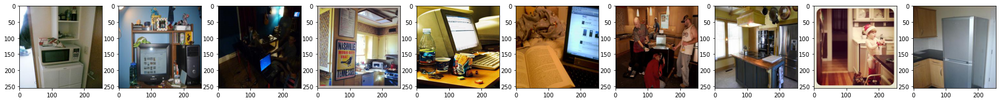


Images included in cluster 12
    -  a beach with a beach and a beach umbrella . 
    -  a man is flying a kite in a park . 
    -  a boat is docked in the water near a lake . 
    -  a beach with a surfboard and a beach 
    -  a group of people in a field with a kite . 
    -  a person is flying a kite in the ocean . 
    -  a man is surfing on a wave in the ocean . 
    -  a large boat is docked in a lake . 
    -  a person is flying a kite on a beach . 
    -  a man riding a wave on a surfboard in the ocean . 


<Figure size 72x72 with 0 Axes>

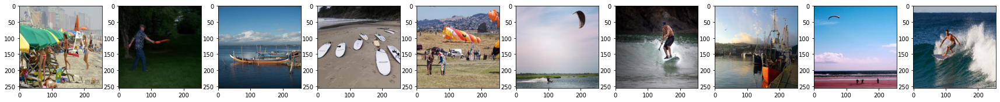


Images included in cluster 13
    -  a man sitting on a bench next to a tree . 
    -  a black and white photo of a bench in the grass . 
    -  a man and a woman are sitting on a bench . 
    -  a man holding a dog on a beach with a dog . 
    -  a dog is laying on a beach next to a dog . 
    -  a couple of horses standing on top of a sandy beach . 
    -  a man is sitting in a bathroom mirror . 
    -  a bench is sitting on a wooden bench . 
    -  a group of people sitting on a bench in front of a building . 
    -  a man is sitting on a bench in a room . 


<Figure size 72x72 with 0 Axes>

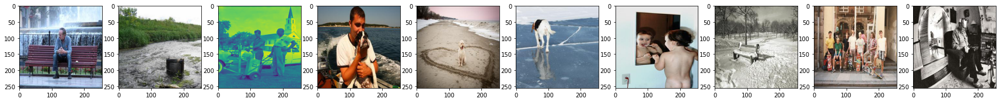


Images included in cluster 14
    -  a man holding a cat in his lap with a cat . 
    -  a cat laying on a wooden bench next to a cat . 
    -  a black and white cat sitting on a black car . 
    -  a cat laying on a bed next to a cat . 
    -  a person is laying on a bed with a snowboard . 
    -  a cat is laying on a bed next to a cat . 
    -  a brown and white cat laying on a bed . 
    -  a black cat sitting on a chair next to a black cat . 
    -  a cat is sitting on a table next to a television . 
    -  a cat sitting on a car seat with a car . 


<Figure size 72x72 with 0 Axes>

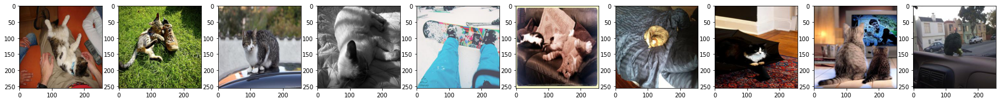


Images included in cluster 15
    -  a dog with a red bow tie on a leash . 
    -  a dog is sitting on a couch with a remote . 
    -  a stuffed bear is sitting on a table next to a teddy bear . 
    -  a dog is sitting on a couch with a cat . 
    -  a stuffed animal with a red bow on a bed . 
    -  a woman and a woman are sitting in front of a teddy bear . 
    -  a man is sitting in front of a table with a dog . 
    -  a small dog is sitting in front of a cake . 
    -  a dog is sitting on a couch with a cat . 
    -  a dog is sitting on a couch with a dog . 


<Figure size 72x72 with 0 Axes>

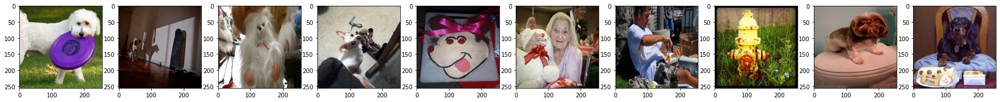

In [ ]:
# Print n images contained in each cluster
for i in range(-1,len(set(labels))-1):
  print('\nImages included in cluster',i)

  # Save top n images in cluster i
  c = captions_df[captions_df['cluster_number']== i].head(10)

  # Plot images and print the caption associated
  plt.figure(i, figsize=(1,1))
  fig, axs = plt.subplots(1,len(c),figsize= (3*len(c),3))

  for index, image_file in enumerate(c['file_name']):
        img = mpimg.imread(filepath + image_file)
        axs[index].imshow(img)
        print('    -',c['sentence'].iloc[index])
  
  
  plt.show()

## IV. Image Indexing

Here we take in a user query to find related images based on their caption. 

We first need to take the user input and inbed it into the transformer neural network. We use the embedded captions from before.

We then use the cosine distance from the embedded captions and the embedded user query to determine proximity.

In [ ]:
def query_images(query, captions_df):
  # Compute embedding for query
  embeddings1 = model.encode(query, convert_to_tensor=True)
  # Compute cosine-similarits
  cosine_scores = util.pytorch_cos_sim(embeddings1, captions_df['embedding'])
  # Save distance to query in the dataframe
  captions_df['distance_to_query']=  [cosine_scores[0][j].item() for j in range(len(captions_df['embedding']))] 
  return embeddings1,captions_df


# Ask user for query
query = input("What do you want to find? ")
print(f'Ok, looking for {query}')

# Look for the query's similarities
query_df = captions_df.copy()
embeddings1, query_df = query_images(query, query_df)

What do you want to find? Tennis court
Ok, looking for Tennis court


Display the top 5 images related to the user query

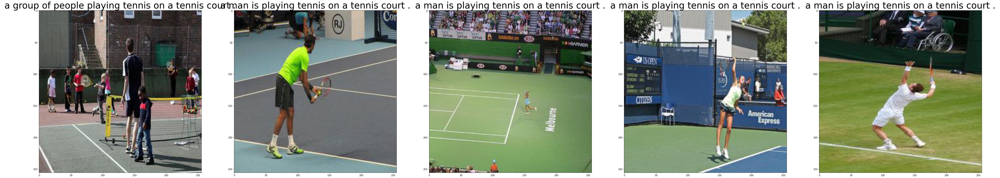

In [ ]:
# Get the top x similarities
query_df=query_df.sort_values(by=["distance_to_query"],ascending=False)
top5_df = query_df.head(5)

# Plot top x similarities
fig, axs = plt.subplots(1,5, figsize= (15*len(top5_df),40))

for index, image_file in enumerate(top5_df['file_name']):
    img = mpimg.imread(filepath + image_file)
    axs[index].imshow(img)
    axs[index].set_title(top5_df['sentence'].iloc[index],fontsize=40)

plt.show()


Below we plot where the query lands in the space of the images. The query is displayed as a red star. It is hard to interpret because like, T-SNE, distances are not respected in UMAP. However, we can see that queries lie close to groups that have related captions.

([<matplotlib.lines.Line2D object at 0x7f560c397650>, <matplotlib.lines.Line2D object at 0x7f560c418950>, <matplotlib.lines.Line2D object at 0x7f5622435c10>, <matplotlib.lines.Line2D object at 0x7f562242ba90>, <matplotlib.lines.Line2D object at 0x7f562242b090>, <matplotlib.lines.Line2D object at 0x7f562242be10>, <matplotlib.lines.Line2D object at 0x7f562169da90>, <matplotlib.lines.Line2D object at 0x7f562169d350>], ['$\\mathdefault{0}$', '$\\mathdefault{2}$', '$\\mathdefault{4}$', '$\\mathdefault{6}$', '$\\mathdefault{8}$', '$\\mathdefault{10}$', '$\\mathdefault{12}$', '$\\mathdefault{14}$'])


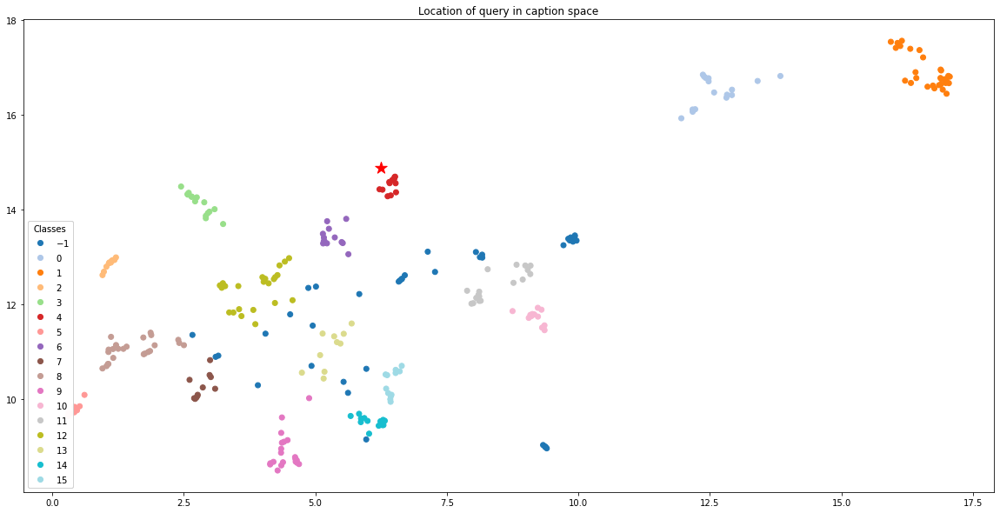

In [ ]:
# Transform query
query_coord = clusterable_embedding.transform(np.reshape(embeddings1, (1,-1)))

# Plot caption space and query 
fig, ax1 = plt.subplots(figsize=(20,10))

scatter = ax1.scatter(coords[:,0],coords[:,1],c= labels, cmap="tab20")
ax1.scatter(query_coord[:,0],query_coord[:,1],c = 'r', marker='*', s=200)
print(scatter.legend_elements())
legend1 = ax1.legend(*scatter.legend_elements(num=14),
                    loc="lower left", title="Classes")
ax1.add_artist(legend1)
ax1.set_title("Location of query in caption space")

plt.show()
